Loading required package: ggplot2


Attaching package: 'ggdag'


The following object is masked from 'package:stats':

    filter




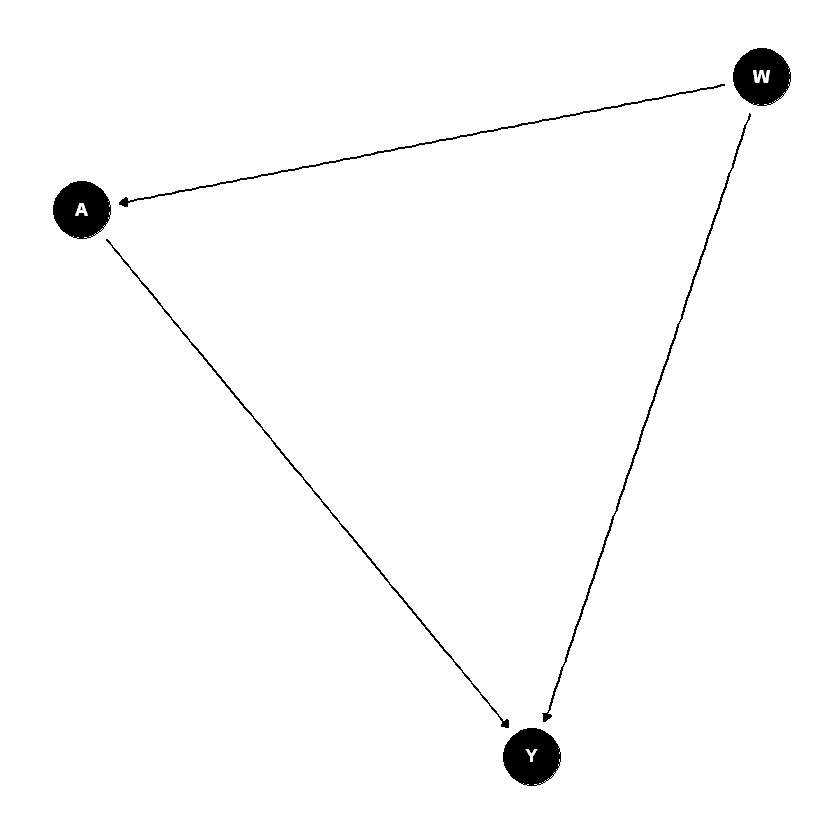

In [1]:
library(dagitty)
library(ggdag)

# make DAG by specifying dependence structure
dag <- dagitty("dag {
    W -> A
    W -> Y
    A -> Y
    W -> A -> Y
  }")
exposures(dag) <- c("A")
outcomes(dag) <- c("Y")
tidy_dag <- tidy_dagitty(dag)

# visualize DAG
ggdag(tidy_dag) + theme_dag()

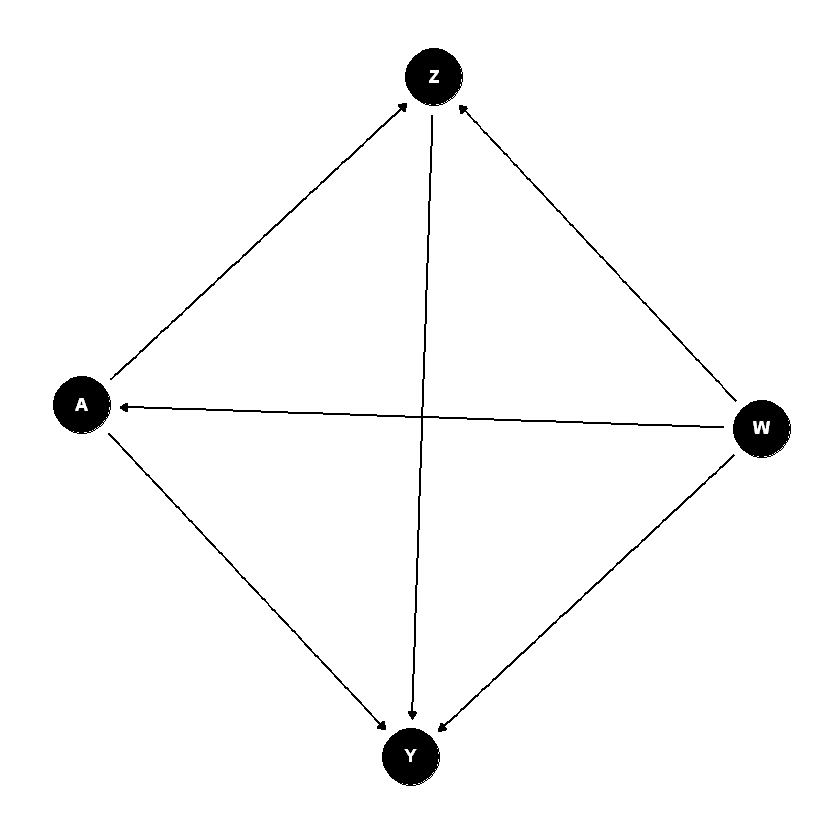

In [2]:
# make DAG by specifying dependence structure
dag <- dagitty("dag {
    W -> A
    W -> Z
    W -> Y
    A -> Z
    A -> Y
    Z -> Y
    W -> A -> Y
    W -> A -> Z -> Y
  }")
exposures(dag) <- c("A")
outcomes(dag) <- c("Y")
tidy_dag <- tidy_dagitty(dag)

# visualize DAG
ggdag(tidy_dag) + theme_dag()

In [3]:
library(data.table)
library(sl3)
library(tmle3)
library(tmle3mediate)

# download data
washb_data <- fread(paste0("https://raw.githubusercontent.com/tlverse/tlverse-data/master/",
    "wash-benefits/washb_data.csv"), stringsAsFactors = TRUE)

head(washb_data)

tmle3mediate v0.0.3: Targeted Learning for Causal Mediation Analysis



whz,tr,fracode,month,aged,sex,momage,momedu,momheight,hfiacat,...,asset_table,asset_chair,asset_khat,asset_chouki,asset_tv,asset_refrig,asset_bike,asset_moto,asset_sewmach,asset_mobile
<dbl>,<fct>,<fct>,<int>,<int>,<fct>,<int>,<fct>,<dbl>,<fct>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
0.00,Control,N05265,9,268,male,30,Primary (1-5y),146.40,Food Secure,...,1,1,1,0,1,0,0,0,0,1
-1.16,Control,N05265,9,286,male,25,Primary (1-5y),148.75,Moderately Food Insecure,...,1,0,1,1,0,0,0,0,0,1
-1.05,Control,N08002,9,264,male,25,Primary (1-5y),152.15,Food Secure,...,0,1,0,1,0,0,0,0,0,1
-1.26,Control,N08002,9,252,female,28,Primary (1-5y),140.25,Food Secure,...,1,1,1,0,0,0,1,0,0,1
-0.59,Control,N06531,9,336,female,19,Secondary (>5y),150.95,Food Secure,...,1,1,1,1,0,0,0,0,0,1
-0.51,Control,N06531,9,304,male,20,Secondary (>5y),154.20,Severely Food Insecure,...,0,0,0,1,0,0,0,0,0,1


In [4]:
# make intervention node binary and subsample
washb_data <- washb_data[sample(.N, 600), ]
washb_data[, `:=`(tr, as.numeric(tr != "Control"))]

In [5]:
head(washb_data)

whz,tr,fracode,month,aged,sex,momage,momedu,momheight,hfiacat,...,asset_table,asset_chair,asset_khat,asset_chouki,asset_tv,asset_refrig,asset_bike,asset_moto,asset_sewmach,asset_mobile
<dbl>,<dbl>,<fct>,<int>,<int>,<fct>,<int>,<fct>,<dbl>,<fct>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
0.25,0,N06524,9,294,male,18,Secondary (>5y),149.55,Food Secure,...,1,1,1,1,1,1,0,0,0,1
0.21,0,N06502,9,300,male,25,No education,151.50,Moderately Food Insecure,...,1,1,0,1,0,0,1,0,0,1
-0.68,1,N06489,6,229,female,32,Secondary (>5y),153.60,Moderately Food Insecure,...,0,0,0,1,0,0,1,0,0,0
-1.40,1,N06458,9,346,male,19,Secondary (>5y),146.40,Food Secure,...,1,1,1,1,1,1,0,1,0,1
-1.73,0,N06458,6,231,female,34,Primary (1-5y),151.25,Mildly Food Insecure,...,0,0,0,0,1,0,0,0,0,1
1.32,1,N06453,5,275,male,24,Primary (1-5y),155.85,Moderately Food Insecure,...,1,1,1,1,1,0,1,0,0,1


In [6]:
node_list <- list(W = c("momage", "momedu", "momheight", "hfiacat", "Nlt18", "Ncomp",
    "watmin", "elec", "floor", "walls", "roof"), A = "tr", Z = c("sex", "month",
    "aged"), Y = "whz")

In [7]:
processed <- process_missing(washb_data, node_list)
washb_data <- processed$data
node_list <- processed$node_list

In [8]:
# SL learners used for continuous data (the nuisance parameter Z)
enet_contin_learner <- Lrnr_glmnet$new(alpha = 0.5, family = "gaussian", nfolds = 3)
lasso_contin_learner <- Lrnr_glmnet$new(alpha = 1, family = "gaussian", nfolds = 3)
fglm_contin_learner <- Lrnr_glm_fast$new(family = gaussian())
mean_learner <- Lrnr_mean$new()
contin_learner_lib <- Stack$new(enet_contin_learner, lasso_contin_learner, fglm_contin_learner,
    mean_learner)
sl_contin_learner <- Lrnr_sl$new(learners = contin_learner_lib)

# SL learners used for binary data (nuisance parameters G and E in this case)
enet_binary_learner <- Lrnr_glmnet$new(alpha = 0.5, family = "binomial", nfolds = 3)
lasso_binary_learner <- Lrnr_glmnet$new(alpha = 1, family = "binomial", nfolds = 3)
fglm_binary_learner <- Lrnr_glm_fast$new(family = binomial())
binary_learner_lib <- Stack$new(enet_binary_learner, lasso_binary_learner, fglm_binary_learner,
    mean_learner)
sl_binary_learner <- Lrnr_sl$new(learners = binary_learner_lib)

# create list for treatment and outcome mechanism regressions
learner_list <- list(Y = sl_contin_learner, A = sl_binary_learner)

In [9]:
tmle_spec_NIE <- tmle_NIE(
    e_learners = Lrnr_cv$new(lasso_binary_learner, full_fit = TRUE),
    psi_Z_learners = Lrnr_cv$new(lasso_contin_learner, full_fit = TRUE),
    max_iter = 1
)

washb_NIE <- tmle3(
    tmle_spec_NIE, washb_data, node_list, learner_list
)

washb_NIE

A tmle3_Fit that took 1 step(s)
   type                  param    init_est    tmle_est         se       lower
1:  NIE NIE[Y_{A=1} - Y_{A=0}] 0.001818514 0.001396068 0.04051222 -0.07800643
        upper psi_transformed lower_transformed upper_transformed
1: 0.08079856     0.001396068       -0.07800643        0.08079856

In [10]:
tmle_spec_NDE <- tmle_NDE(
    e_learners = Lrnr_cv$new(lasso_binary_learner, full_fit = TRUE),
    psi_Z_learners = Lrnr_cv$new(lasso_contin_learner, full_fit = TRUE),
    max_iter = 1
)

washb_NDE <- tmle3(
    tmle_spec_NDE, washb_data, node_list, learner_list
)

washb_NDE

A tmle3_Fit that took 1 step(s)
   type                  param  init_est  tmle_est         se      lower
1:  NDE NDE[Y_{A=1} - Y_{A=0}] 0.0141252 0.0141252 0.07758281 -0.1379343
       upper psi_transformed lower_transformed upper_transformed
1: 0.1661847       0.0141252        -0.1379343         0.1661847

In [11]:
# set the IPSI multiplicative shift
delta_ipsi <- 3

# instantiate tmle3 spec for stochastic mediation
tmle_spec_pie_decomp <- tmle_medshift(
    delta = delta_ipsi,
    e_learners = Lrnr_cv$new(lasso_binary_learner, full_fit = TRUE),
    phi_learners = Lrnr_cv$new(lasso_contin_learner, full_fit = TRUE)
)

# compute the TML estimate
washb_pie_decomp <- tmle3(
    tmle_spec_pie_decomp, washb_data, node_list, learner_list
)

washb_pie_decomp

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf replaced by maximum positive value"
Warning message in optimize(function(par) fn(par, ...)/con$fnscale, lower = lower, :
"NA/Inf repl

A tmle3_Fit that took 10000 step(s)
   type         param   init_est   tmle_est         se      lower      upper
1: PIDE E[Y_{A=NULL}] -0.6372387 -0.6371547 0.04244255 -0.7203406 -0.5539688
   psi_transformed lower_transformed upper_transformed
1:      -0.6371547        -0.7203406        -0.5539688

In [12]:
# get the PIDE
washb_pie_decomp$summary$tmle_est - mean(washb_data[, get(node_list$Y)])

[1] 0.002311963

In [14]:
n <- 100000
set.seed(2350)

In [15]:
w0 <- rbinom(n, 1, .5)
w1 <- rbinom(n, 1, 0.4 + 0.2*w0)
a <- rbinom(n, 1, 0.5)
z0 <- rbinom(n, 1, plogis(-log(2) * w1))
z1 <- rbinom(n, 1, plogis(log(4) - log(2)*w1))
z <- ifelse(a == 1, z1, z0)
m0 <- rbinom(n, 1, plogis(-log(3) - log(1.4)*w1))
m1 <- rbinom(n, 1, plogis(-log(3) + log(10) - log(1.4)*w1))
m <- ifelse(z == 1, m1, m0)
y <- rbinom(n, 1, plogis(log(1.2) + log(3) * z + log(3) * m - log(1.2) * w1 + log(1.2) * w1 * z))

In [19]:
probsel <- plogis(-1 + log(4)*w1 + log(4)*w0)
psel <- rbinom(n, 1, probsel)

In [23]:
washb_data <- data.frame(w0 = w0, w1 = w1, a = a, z = z, m = m, y = y,
                         psel = psel, radid_person=seq(1, n, 1))
washb_data <- washb_data[washb_data$psel == 1, ]
washb_data <- washb_data[, -c(7)]
head(washb_data)

,w0,w1,a,z,m,y,radid_person
,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
2,1,1,0,1,1,1,2
4,0,1,0,0,0,0,4
5,1,1,1,1,0,0,5
6,0,1,1,1,1,1,6
10,1,1,1,1,1,1,10
13,1,1,0,0,0,1,13


In [24]:
node_list <- list(W = c("w0", "w1"), A = "a", Z = c("z"), Y = "y")

In [25]:
washb_NIE <- tmle3(
    tmle_spec_NIE, washb_data, node_list, learner_list
)

washb_NIE

A tmle3_Fit that took 1 step(s)
   type                  param  init_est  tmle_est          se     lower
1:  NIE NIE[Y_{A=1} - Y_{A=0}] 0.1038018 0.1038025 0.002339917 0.0992163
       upper psi_transformed lower_transformed upper_transformed
1: 0.1083886       0.1038025         0.0992163         0.1083886

In [26]:
washb_NDE <- tmle3(
    tmle_spec_NDE, washb_data, node_list, learner_list
)

washb_NDE

A tmle3_Fit that took 1 step(s)
   type                  param    init_est    tmle_est          se        lower
1:  NDE NDE[Y_{A=1} - Y_{A=0}] 0.001429207 0.001429207 0.004368105 -0.007132121
         upper psi_transformed lower_transformed upper_transformed
1: 0.009990535     0.001429207      -0.007132121       0.009990535